<!-- codex-purpose-v2 -->
# 04 - V1 GradCAM Pseudo Labels

## Purpose
Generate the first binary pseudo masks from GradCAM heatmaps.

## Research Thinking
- V1 answers the baseline question: can classifier attention be thresholded into
  usable lesion masks?
- The method is intentionally simple so later versions have a clean control.
- Expected weaknesses are fixed-threshold sensitivity, missing faint lesions,
  and including non-lesion discriminative context.

## Inputs / Outputs
- Input: classifier checkpoint, training images, and GradCAM maps.
- Output: `data/pseudo_labels_train/`, `data/processed_train/`, and coverage
  statistics.

## How To Read The Result
Use V1 as the control experiment. It establishes the first measurable
segmentation baseline, not the final biological mask.


# 04 · Pseudo-Label Generation

Grad-CAM heatmap từ notebook 03 cho thấy classifier thường nhìn vào vùng liên quan đến bệnh, nhưng output hiện tại cũng xác nhận một giới hạn quan trọng: Grad-CAM hay tập trung vào vùng discriminative nhất thay vì toàn bộ lesion. Notebook này chuyển attention map thành binary pseudo-mask và đánh giá xem mask đó có đủ dùng cho segmentation hay chưa.

Pipeline: sinh Grad-CAM theo target class → normalize/resize heatmap → threshold → morphological post-processing → lưu mask PNG và metadata QA. Pseudo-label V1 là nhãn yếu để tạo baseline segmentation, không được xem như annotation pixel-level sạch.

---

**Những gì notebook này làm:**

1. **Load data + model** — toàn bộ 3,104 ảnh train, nạp `best_model.pth`
2. **Setup Grad-CAM** — EfficientNet-B0, target layer `base.features.8.0`, transform inference 224 x 224 với ImageNet normalization
3. **Tạo pseudo-label** — fixed threshold 0.5 + CLOSE/OPEN/fill holes/connected components
4. **Visualization** — Original | Grad-CAM overlay | Pseudo mask overlay
5. **Threshold diagnostic** — so sánh fixed, percentile, Otsu và adaptive
6. **Proxy + GT evaluation** — coverage, components, confidence, quality gate, IoU/Dice/precision/recall trên GT_OK
7. **Export segmentation-ready metadata** — phân nhóm train_candidate, manual_review và Healthy negative/exclude

**Output:** Masks tại `data/pseudo_labels_train/` · Ảnh resize tại `data/processed_train/` · Figures tại `visualizations/pseudo_labeling/` · Metadata review tại `data/pseudo_labels_train_v1_review/`


In [ ]:
import os
import sys
import json
import random
proj_root = r'E:\Master\thesis-clean'
sys.path.insert(0, proj_root)
sys.path.insert(0, os.path.join(proj_root, 'utils'))

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import cv2
from tqdm import tqdm
from pathlib import Path
from PIL import Image
from collections import defaultdict
from datetime import datetime
import torch
from torchvision import transforms

from utils.models import EfficientNetClassifier
from utils.gradcam import GradCAMGenerator, find_efficientnet_target_layer

# Plot style — nhất quán với notebook 01-03
plt.style.use('default')
sns.set_palette("husl")

# Class metadata — nhất quán với notebook 01-03
CLASS_NAMES  = ["ALGAL_LEAF_SPOT", "ALLOCARIDARA_ATTACK", "HEALTHY_LEAF", "LEAF_BLIGHT", "PHOMOPSIS_LEAF_SPOT"]
CLASS_LABELS = ["Algal Leaf Spot", "Allocaridara Attack", "Healthy Leaf", "Leaf Blight", "Phomopsis Leaf Spot"]
CLASS_COLORS = ["#E69F00", "#56B4E9", "#009E73", "#0072B2", "#D55E00"]
CLASS_TO_IDX = {name: i for i, name in enumerate(CLASS_NAMES)}
IDX_TO_LABEL = {i: label for i, label in enumerate(CLASS_LABELS)}

VIZ_DIR = "visualizations/pseudo_labeling"
os.makedirs(VIZ_DIR, exist_ok=True)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
print(f"Seed: {SEED}")

Device: cuda


**Nhận xét sau output — Environment setup**

- **Quan sát chính:** Notebook in ra device đang dùng và seed. Sau lần chạy hiện tại, các cell downstream đã execute thành công và lưu output/hình/CSV.
- **Đánh giá chất lượng pseudo-label:** Seed giúp tái lập phần chọn mẫu/tiền xử lý deterministic; riêng Grad-CAM vẫn phụ thuộc checkpoint và backend tính toán.
- **Rủi ro:** Cell này hiện có `execution_count` trống trong file notebook dù có output, có thể do bạn chạy một phần notebook hoặc save sau chỉnh sửa. Không ảnh hưởng kết quả đã sinh nếu các cell sau vẫn còn output.
- **Hàm ý cho segmentation:** Nên giữ seed cố định khi regenerate pseudo-label để metadata, QA subset và split train có thể đối chiếu lại.
- **Cải thiện đề xuất:** Khi chốt thí nghiệm, rerun notebook từ đầu và save để execution_count/output đồng bộ hoàn toàn.


## Load Data + Model

Dùng cùng tập train và cùng checkpoint với notebook 03 — đảm bảo pseudo-label sinh ra từ đúng model đã được evaluate. Load `best_model.pth` (val_acc 98.19% tại epoch 11), không dùng `resume.pth`.

Lưu ý: notebook này sẽ chạy lại toàn bộ Grad-CAM pipeline trên 3,104 ảnh. Nếu đã có `pseudo_labels_train/` từ lần chạy trước thì có thể skip và dùng lại output.

In [2]:
train_dir = os.path.join(proj_root, 'notebooks', 'data', 'raw', 'train')
print(f"Train dir: {train_dir}")

selected_samples = []

for cls_name in CLASS_NAMES:
    cls_dir = Path(train_dir) / cls_name
    cls_idx = CLASS_TO_IDX[cls_name]
    imgs = sorted(list(cls_dir.glob("*.jpg")) + list(cls_dir.glob("*.png")))
    for img_path in imgs:
        selected_samples.append((str(img_path), cls_idx, cls_name))
    print(f"  {cls_name}: {len(imgs)} ảnh")

print(f"\nTổng: {len(selected_samples)} ảnh")

Train dir: e:\Master\thesis-clean\notebooks\data\raw\train
  ALGAL_LEAF_SPOT: 513 ảnh
  ALLOCARIDARA_ATTACK: 639 ảnh
  HEALTHY_LEAF: 683 ảnh
  LEAF_BLIGHT: 655 ảnh
  PHOMOPSIS_LEAF_SPOT: 614 ảnh

Tổng: 3104 ảnh


**Nhận xét sau output — Input dataset**

- **Quan sát chính:** Tập train có 3,104 ảnh: Algal 513, Allocaridara 639, Healthy 683, Leaf Blight 655, Phomopsis 614. Dữ liệu được lấy từ folder class nên target class cho Grad-CAM chính là nhãn folder.
- **Đánh giá chất lượng pseudo-label:** Số lượng mẫu đủ lớn để tạo baseline segmentation, nhưng Healthy là negative class về mặt lesion và phải được xử lý khác disease classes.
- **Rủi ro:** Nếu folder label sai, Grad-CAM target theo folder cũng sai. Pseudo-label sẽ kế thừa lỗi nhãn classification.
- **Hàm ý cho segmentation:** Segmentation binary lesion nên dùng disease classes làm positive mask; Healthy nên là empty mask hoặc exclude khỏi tập positive.
- **Cải thiện đề xuất:** Lưu manifest gồm image_path, class_name, split và recommended_use để segmentation dataloader không phải suy luận từ filename.


In [3]:
model = EfficientNetClassifier(num_classes=len(CLASS_NAMES), backbone='efficientnet_b0', pretrained=False)

ckpt_path = 'models/classification/checkpoints/best_model.pth'
if not os.path.exists(ckpt_path):
    raise FileNotFoundError(f"Không tìm thấy {ckpt_path}. Chạy notebook 02 trước.")

checkpoint = torch.load(ckpt_path, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(device).eval()
print(f"Loaded: {ckpt_path} — val_acc at save: {checkpoint.get('val_acc', 'N/A'):.4f}")

Loaded: models/classification/checkpoints/best_model.pth — val_acc at save: 0.9819


**Nhận xét sau output — Classification checkpoint**

- **Quan sát chính:** Notebook load `models/classification/checkpoints/best_model.pth`; output checkpoint ghi val_acc 0.9819. Đây là nguồn Grad-CAM hợp lý vì classifier đã có hiệu năng cao.
- **Đánh giá chất lượng pseudo-label:** Classifier mạnh giúp giảm pseudo-label sai do chọn nhầm class. Tuy nhiên GT_OK cho thấy classifier confidence cao không đồng nghĩa mask đúng biên.
- **Rủi ro:** Pseudo-label phụ thuộc trực tiếp vào classifier. Nếu classifier dựa vào background/context thay vì lesion, Grad-CAM cũng sẽ kéo mask ra khỏi vùng bệnh thật.
- **Hàm ý cho segmentation:** Cần quality gate dựa trên mask/GT proxy, không chỉ dựa vào confidence classification.
- **Cải thiện đề xuất:** Ghi checkpoint path, val_acc và class mapping vào metadata export để đảm bảo truy vết thí nghiệm.


## Setup Grad-CAM

Cùng target layer và transform với notebook 03. Transform không có augmentation — cần output ổn định để tạo mask nhất quán. Nếu augment, mỗi lần chạy sẽ ra mask khác nhau.

In [4]:
target_layer = find_efficientnet_target_layer(model)
gradcam_gen = GradCAMGenerator(model, target_layer=target_layer, device=device.type)
print('Grad-CAM target layer:', target_layer)

infer_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

Grad-CAM target layer: base.features.8.0


**Nhận xét sau output — Grad-CAM setup**

- **Quan sát chính:** Target layer được auto-detect là `base.features.8.0`, tức block convolution sâu cuối của EfficientNet-B0. Transform inference resize ảnh về 224 x 224, ToTensor và ImageNet normalization, nhất quán với classifier.
- **Đánh giá chất lượng pseudo-label:** Dùng layer sâu giúp CAM có ngữ nghĩa class tốt, nhưng spatial resolution thấp nên heatmap mượt và biên lesion không sắc.
- **Rủi ro:** Nếu segmentation cần lesion nhỏ/biên chính xác, layer sâu dễ bỏ sót chi tiết. Resize trực tiếp 224 x 224 cũng có thể làm biến dạng nhẹ nếu ảnh gốc không vuông.
- **Hàm ý cho segmentation:** Alignment hiện nhất quán vì ảnh processed và mask đều là 224 x 224. Nếu train segmentation ở kích thước khác, phải resize ảnh và mask bằng interpolation phù hợp: bilinear cho ảnh, nearest cho mask.
- **Cải thiện đề xuất:** Thử thêm Grad-CAM++ hoặc layer nông hơn/multi-layer CAM để cải thiện coverage lesion nhỏ.


## Tạo Pseudo-Label

Các bước chính cho mỗi ảnh:
1. **Threshold heatmap >= 0.5** → binary mask thô, pixel = 1 nếu attention cao.
2. **MORPH_CLOSE (5 x 5)** → khép khoảng trống nhỏ trong vùng activation.
3. **MORPH_OPEN (5 x 5)** → loại nhiễu nhỏ sau threshold.
4. **Fill holes + connected components** → làm mask liền vùng và giữ tối đa 2 component đủ lớn.

Kernel 5 x 5 tương đương khoảng 2.2% chiều rộng/cao ảnh 224 x 224, không phải 2.2% diện tích ảnh. Mỗi ảnh lưu ra hai file: ảnh RGB resize 224 x 224 và mask PNG nhị phân 0/255 để alignment với segmentation notebook được nhất quán.


### Hàm hóa pipeline threshold và hậu xử lý

Cell này chuẩn hóa các bước quan trọng để notebook có thể dùng như pipeline tạo dữ liệu segmentation, không chỉ là minh họa. Các điểm được cố định rõ: input ảnh RGB, target class là nhãn folder hiện tại, Grad-CAM sinh trên lớp đích đó, heatmap resize/alignment về 224 x 224 theo cùng kích thước ảnh đã lưu cho segmentation baseline.

Các threshold được hỗ trợ:
- fixed: ngưỡng tuyệt đối trên heatmap đã normalize, dùng baseline 0.5.
- percentile: giữ vùng activation mạnh nhất theo phân vị, thường ổn định hơn khi cường độ heatmap giữa ảnh khác nhau.
- otsu: tự tách foreground/background trên heatmap 8-bit, phù hợp khi phân bố heatmap có hai mode tương đối rõ.
- adaptive: dùng ngưỡng cục bộ trên heatmap 8-bit, chỉ nên dùng như diagnostic vì Grad-CAM vốn rất mượt, adaptive dễ tạo mảng rời rạc.


In [ ]:
def normalize_heatmap(heatmap):
    heatmap = np.squeeze(heatmap).astype(np.float32)
    heatmap = np.nan_to_num(heatmap, nan=0.0, posinf=1.0, neginf=0.0)
    if heatmap.max() > heatmap.min():
        heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
    return np.clip(heatmap, 0, 1)


def resize_heatmap_to_image(heatmap, image_shape):
    h, w = image_shape[:2]
    heatmap = normalize_heatmap(heatmap)
    if heatmap.shape != (h, w):
        heatmap = cv2.resize(heatmap, (w, h), interpolation=cv2.INTER_LINEAR)
    return normalize_heatmap(heatmap)


def threshold_heatmap(heatmap, method="fixed", value=0.5, percentile=85, block_size=35, c=2):
    heatmap = normalize_heatmap(heatmap)
    h8 = (heatmap * 255).astype(np.uint8)

    if method == "fixed":
        threshold_value = float(value)
        mask = (heatmap >= threshold_value).astype(np.uint8)
    elif method == "percentile":
        threshold_value = float(np.percentile(heatmap, percentile))
        mask = (heatmap >= threshold_value).astype(np.uint8)
    elif method == "otsu":
        threshold_uint8, mask_uint8 = cv2.threshold(h8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
        threshold_value = float(threshold_uint8 / 255.0)
        mask = (mask_uint8 > 0).astype(np.uint8)
    elif method == "adaptive":
        block_size = int(block_size)
        if block_size % 2 == 0:
            block_size += 1
        block_size = max(block_size, 3)
        mask_uint8 = cv2.adaptiveThreshold(h8, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, c)
        threshold_value = None
        mask = (mask_uint8 > 0).astype(np.uint8)
    else:
        raise ValueError(f"Unknown threshold method: {method}")

    return mask, threshold_value


def fill_mask_holes(mask):
    mask = mask.astype(np.uint8)
    flood = (mask * 255).copy()
    h, w = flood.shape[:2]
    ff_mask = np.zeros((h + 2, w + 2), np.uint8)
    cv2.floodFill(flood, ff_mask, (0, 0), 255)
    holes = cv2.bitwise_not(flood) > 0
    return np.logical_or(mask > 0, holes).astype(np.uint8)


def keep_largest_components(mask, max_components=2, min_area=32):
    mask = mask.astype(np.uint8)
    n_labels, labels, stats_cc, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    if n_labels <= 1:
        return mask

    comps = []
    for label_id in range(1, n_labels):
        area = int(stats_cc[label_id, cv2.CC_STAT_AREA])
        if area >= min_area:
            comps.append((area, label_id))
    comps = sorted(comps, reverse=True)[:max_components]
    if not comps:
        return np.zeros_like(mask)

    out = np.zeros_like(mask)
    for _, label_id in comps:
        out[labels == label_id] = 1
    return out


def postprocess_mask(mask, kernel_size=5, min_area=32, max_components=2, fill_holes=True, smooth_boundary=True):
    mask = mask.astype(np.uint8)
    kernel = np.ones((kernel_size, kernel_size), np.uint8)

    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
    if fill_holes:
        mask = fill_mask_holes(mask)
    mask = keep_largest_components(mask, max_components=max_components, min_area=min_area)
    if smooth_boundary:
        mask = cv2.medianBlur((mask * 255).astype(np.uint8), 5)
        mask = (mask > 127).astype(np.uint8)
    return mask


def mask_quality_features(mask):
    mask = mask.astype(np.uint8)
    n_labels, _, stats_cc, _ = cv2.connectedComponentsWithStats(mask, connectivity=8)
    areas = [int(stats_cc[i, cv2.CC_STAT_AREA]) for i in range(1, n_labels)]
    total_area = int(mask.sum())
    largest = max(areas) if areas else 0
    boundary = cv2.morphologyEx(mask, cv2.MORPH_GRADIENT, np.ones((3, 3), np.uint8))
    return {
        "mask_area_ratio": float(mask.mean()),
        "num_components": int(len(areas)),
        "largest_component_ratio": float(largest / total_area) if total_area > 0 else 0.0,
        "boundary_pixel_ratio": float(boundary.mean()),
    }


def make_overlays(orig_arr, heatmap, mask, mask_color=(0, 255, 0)):
    heatmap = resize_heatmap_to_image(heatmap, orig_arr.shape)
    heatmap_colored = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
    heatmap_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)
    gradcam_overlay = cv2.addWeighted(orig_arr, 0.6, heatmap_rgb, 0.4, 0)

    mask_rgb = np.zeros_like(orig_arr)
    mask_rgb[:, :, 0] = mask.astype(np.uint8) * mask_color[0]
    mask_rgb[:, :, 1] = mask.astype(np.uint8) * mask_color[1]
    mask_rgb[:, :, 2] = mask.astype(np.uint8) * mask_color[2]
    pseudo_overlay = cv2.addWeighted(orig_arr, 0.7, mask_rgb, 0.3, 0)
    return gradcam_overlay, pseudo_overlay


In [5]:
pseudo_dir = Path(os.path.join(proj_root, 'notebooks', 'data', 'pseudo_labels_train'))
processed_dir = Path(os.path.join(proj_root, 'notebooks', 'data', 'processed_train'))
pseudo_dir.mkdir(parents=True, exist_ok=True)
processed_dir.mkdir(parents=True, exist_ok=True)

stats = []
results_by_class = defaultdict(list)

# V1 baseline: fixed threshold 0.5. Các threshold khác được phân tích ở cell diagnostic phía dưới.
THRESHOLD_METHOD = "fixed"
FIXED_THRESHOLD = 0.5

for img_path, cls_idx, cls_name in tqdm(selected_samples, desc="Pseudo-label generation"):
    try:
        orig_img = Image.open(img_path).convert("RGB").resize((224, 224))
        orig_arr = np.array(orig_img)

        input_tensor = infer_transform(orig_img).unsqueeze(0).to(device)

        # Grad-CAM được sinh theo nhãn folder/target class hiện tại.
        # Nếu pred_class != cls_idx, mask vẫn là class-target CAM nhưng được đánh dấu low-trust trong metadata.
        heatmap, confidence, pred_class = gradcam_gen.generate(input_tensor, cls_idx)

        heatmap_2d = resize_heatmap_to_image(heatmap, orig_arr.shape)

        # Tạo binary mask V1 và hậu xử lý theo cùng chính sách cho toàn bộ ảnh.
        mask_raw, threshold_value = threshold_heatmap(heatmap_2d, method=THRESHOLD_METHOD, value=FIXED_THRESHOLD)
        mask = postprocess_mask(mask_raw, kernel_size=5, min_area=32, max_components=2, fill_holes=True, smooth_boundary=True)

        # Lưu mask + ảnh gốc resize 224 x 224 để segmentation notebook đọc cùng alignment.
        fname = Path(img_path).name
        base_name = f"{cls_name}_{fname}"
        mask_path = pseudo_dir / f"{base_name}_pseudo.png"
        image_path_out = processed_dir / base_name
        cv2.imwrite(str(mask_path), (mask * 255).astype(np.uint8))
        orig_img.save(str(image_path_out))

        gradcam_overlay, pseudo_overlay = make_overlays(orig_arr, heatmap_2d, mask)
        quality = mask_quality_features(mask)

        stats.append({
            "image_id": Path(img_path).stem,
            "filename": base_name,
            "original_path": img_path,
            "processed_image_path": str(image_path_out),
            "pseudo_mask_path": str(mask_path),
            "class_name": cls_name,
            "class_idx": int(cls_idx),
            "target_class": int(cls_idx),
            "pred_class": int(pred_class),
            "confidence": float(confidence),
            "threshold_method": THRESHOLD_METHOD,
            "threshold_value": float(threshold_value),
            "mask_coverage": quality["mask_area_ratio"],
            "mask_area_ratio": quality["mask_area_ratio"],
            "num_components": quality["num_components"],
            "largest_component_ratio": quality["largest_component_ratio"],
            "boundary_pixel_ratio": quality["boundary_pixel_ratio"],
            "is_disease_class": bool(cls_name != "HEALTHY_LEAF"),
            "segmentation_trust": "high" if (pred_class == cls_idx and confidence >= 0.8 and cls_name != "HEALTHY_LEAF") else "review",
        })
        results_by_class[cls_name].append({
            "orig_arr": orig_arr,
            "heatmap": heatmap_2d,
            "gradcam_overlay": gradcam_overlay,
            "mask_raw": mask_raw,
            "mask": mask,
            "pseudo_overlay": pseudo_overlay,
            "confidence": float(confidence),
            "pred_class": int(pred_class),
            "true_class": int(cls_idx),
            "filename": base_name,
        })

    except Exception as e:
        print(f"  Lỗi {img_path}: {e}")

with open(pseudo_dir / "pseudo_label_stats.json", "w", encoding="utf-8") as f:
    json.dump(stats, f, indent=2, ensure_ascii=False)

pd.DataFrame(stats).to_csv(pseudo_dir / "pseudo_label_metadata.csv", index=False)

print(f"\nGenerated: {len(stats)} pseudo-labels")
print(f"Masks → {pseudo_dir}")
print(f"Images → {processed_dir}")

Pseudo-label generation: 100%|██████████| 3104/3104 [14:00<00:00,  3.69it/s]



Generated: 3104 pseudo-labels
Masks → e:\Master\thesis-clean\notebooks\data\pseudo_labels_train
Images → e:\Master\thesis-clean\notebooks\data\processed_train


**Nhận xét sau output — Pseudo-label generation**

- **Quan sát chính:** Pipeline đã sinh đủ 3,104 pseudo-labels, lưu mask ở `notebooks/data/pseudo_labels_train` và ảnh resize ở `notebooks/data/processed_train`.
- **Đánh giá chất lượng pseudo-label:** Việc lưu ảnh resize cùng mask giúp segmentation dataloader đọc cặp ảnh/mask aligned. Metadata mới cũng có target_class, pred_class, confidence, threshold, area và component stats.
- **Rủi ro:** Folder mask thô vẫn chứa cả Healthy mask dương và một số outlier over-coverage; không nên dùng trực tiếp toàn bộ folder này làm hard-label train set.
- **Hàm ý cho segmentation:** Nên đi qua `metadata_v1_review.csv` để lọc train_candidate/manual_review thay vì glob toàn bộ PNG.
- **Cải thiện đề xuất:** Tạo thêm folder export sạch gồm disease train_candidate và healthy empty masks để notebook segmentation đọc an toàn hơn.


## Visualization

Hai chart:
1. **Best sample per class** — ảnh confidence cao nhất, xem mask có khớp vùng tổn thương không
2. **Morphological demo** — so sánh mask thô (threshold only) vs. mask sau CLOSE+OPEN trên cùng một ảnh

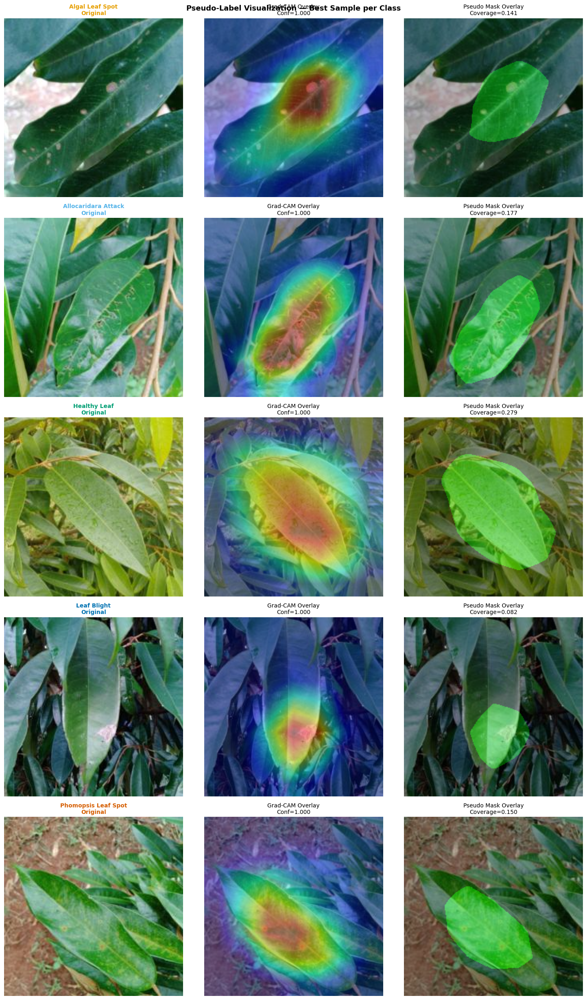

Saved → visualizations/pseudo_labeling/pseudo_label_per_class.png


In [6]:
n_classes = len(CLASS_NAMES)
fig, axes = plt.subplots(n_classes, 3, figsize=(15, 5 * n_classes))
fig.suptitle("Pseudo-Label Visualization — Best Sample per Class", fontsize=13, fontweight="bold")

for i, (cls_name, cls_label, cls_color) in enumerate(zip(CLASS_NAMES, CLASS_LABELS, CLASS_COLORS)):
    items = results_by_class.get(cls_name, [])
    if not items:
        continue
    best = max(items, key=lambda x: x["confidence"])

    axes[i, 0].imshow(best["orig_arr"])
    axes[i, 0].set_title(f"{cls_label}\nOriginal", fontsize=10, fontweight="bold", color=cls_color)
    axes[i, 0].axis("off")

    axes[i, 1].imshow(best["gradcam_overlay"])
    axes[i, 1].set_title(f"Grad-CAM Overlay\nConf={best['confidence']:.3f}", fontsize=10)
    axes[i, 1].axis("off")

    axes[i, 2].imshow(best["pseudo_overlay"])
    axes[i, 2].set_title(f"Pseudo Mask Overlay\nCoverage={best['mask'].mean():.3f}", fontsize=10)
    axes[i, 2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(VIZ_DIR, "pseudo_label_per_class.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/pseudo_label_per_class.png")

**Nhận xét sau output — Pseudo-label per class**

- **Quan sát chính:** Grid best-sample sau rerun cho thấy Grad-CAM bám vào một vùng activation lớn trên phiến lá. Coverage trong hình lần lượt khoảng Algal 0.140, Allocaridara 0.185, Healthy 0.387, Leaf Blight 0.105 và Phomopsis 0.172. Leaf Blight là ví dụ trực quan tốt nhất vì mask phủ vùng cháy lá chính; Algal và Phomopsis vẫn chỉ bắt cụm/đốm nổi bật nhất.
- **Đánh giá chất lượng pseudo-label:** Mask có tính nhất quán về hình dạng và không bị nhiễu lấm tấm, nhưng thiên về vùng discriminative hơn là toàn bộ lesion. Với bệnh nhiều đốm nhỏ, pseudo-label bỏ sót các vùng bệnh rải rác ngoài tâm Grad-CAM.
- **Rủi ro:** Healthy Leaf tạo mask dương lớn trên lá dù không có lesion. Đây là activation cho class khỏe, không phải mask bệnh; nếu dùng như positive label sẽ làm segmentation model học sai mục tiêu.
- **Hàm ý cho segmentation:** Có thể dùng các disease-class mask làm weak label khởi tạo, nhưng cần loại/đánh dấu review ảnh Healthy. Với binary lesion segmentation, Healthy nên là empty mask hoặc excluded khỏi tập positive.
- **Cải thiện đề xuất:** Không chọn train sample chỉ theo confidence cao; cần thêm quality gate theo class, area, classifier correctness và đánh giá GT_OK vì confidence 1.000 vẫn có thể đi kèm mask sai biên hoặc lan nền.


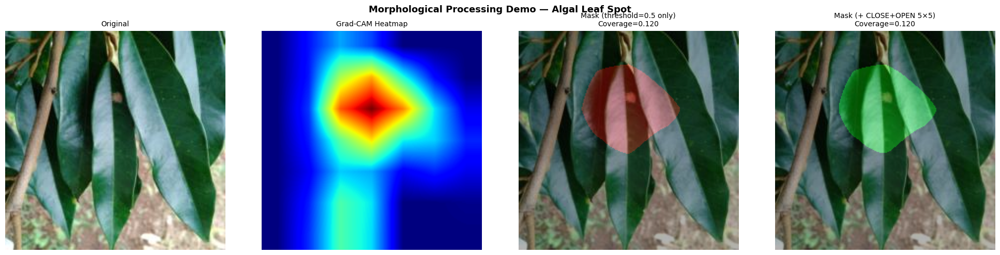

Saved → visualizations/pseudo_labeling/morphological_demo.png


In [14]:
demo_cls = CLASS_NAMES[0]
demo_items = results_by_class.get(demo_cls, [])

if demo_items:
    demo = demo_items[0]
    orig_arr = demo["orig_arr"]
    heatmap_2d = demo["heatmap"]

    mask_raw = (heatmap_2d >= 0.5).astype(np.uint8)
    mask_raw_rgb = np.zeros_like(orig_arr)
    mask_raw_rgb[:, :, 0] = mask_raw * 255  # red — mask thô
    mask_raw_overlay = cv2.addWeighted(orig_arr, 0.7, mask_raw_rgb, 0.3, 0)

    mask_morph = demo["mask"]
    mask_morph_rgb = np.zeros_like(orig_arr)
    mask_morph_rgb[:, :, 1] = mask_morph * 255  # green — sau morphological
    mask_morph_overlay = cv2.addWeighted(orig_arr, 0.7, mask_morph_rgb, 0.3, 0)

    fig2, axes2 = plt.subplots(1, 4, figsize=(20, 5))
    fig2.suptitle(f"Morphological Processing Demo — {CLASS_LABELS[0]}", fontsize=13, fontweight="bold")

    axes2[0].imshow(orig_arr)
    axes2[0].set_title("Original", fontsize=10)
    axes2[0].axis("off")

    axes2[1].imshow(heatmap_2d, cmap="jet")
    axes2[1].set_title("Grad-CAM Heatmap", fontsize=10)
    axes2[1].axis("off")

    axes2[2].imshow(mask_raw_overlay)
    axes2[2].set_title(f"Mask (threshold=0.5 only)\nCoverage={mask_raw.mean():.3f}", fontsize=10)
    axes2[2].axis("off")

    axes2[3].imshow(mask_morph_overlay)
    axes2[3].set_title(f"Mask (+ CLOSE+OPEN 5×5)\nCoverage={mask_morph.mean():.3f}", fontsize=10)
    axes2[3].axis("off")

    plt.tight_layout()
    plt.savefig(os.path.join(VIZ_DIR, "morphological_demo.png"), dpi=150, bbox_inches="tight")
    plt.show()
    print(f"Saved → {VIZ_DIR}/morphological_demo.png")

**Nhận xét sau output — Morphological processing**

- **Quan sát chính:** Ở sample Algal demo, mask raw threshold 0.5 có coverage 0.120 và sau CLOSE+OPEN 5 x 5 vẫn là 0.120. Hậu xử lý không đổi diện tích đáng kể, chủ yếu làm biên đều và loại/khép các điểm nhỏ.
- **Đánh giá chất lượng pseudo-label:** Mask phủ đúng vùng lá nơi có đốm nổi bật gần tâm heatmap, nhưng vẫn rộng hơn tổn thương thật và bỏ qua các đốm nhỏ khác trên cùng lá.
- **Rủi ro:** Hậu xử lý morphology làm mask mượt hơn nhưng không giải quyết bản chất under-localization/over-smoothing của Grad-CAM. Khi heatmap đã lan trên gân lá hoặc nền, CLOSE/OPEN có thể củng cố vùng sai thay vì sửa nó.
- **Hàm ý cho segmentation:** Mask sau morphology phù hợp hơn mask raw để train thử nghiệm, nhưng nên dùng như nhãn yếu. Không nên tối ưu segmentation loss như với annotation thủ công sạch nếu chưa có weighting/QA.
- **Cải thiện đề xuất:** Giữ connected components lớn nhất hoặc 2 components là hợp lý cho V1, nhưng cần upper-bound area để loại các ca mask gần toàn ảnh; kernel/min_area nên tune bằng GT_OK thay vì chọn cố định.


## Đánh Giá Chất Lượng Pseudo-Label

Hai chỉ số quan trọng:
- **Mask coverage** — tỉ lệ pixel được đánh dấu là bệnh. Quá cao (>0.8) nghĩa là mask chiếm gần hết ảnh, không phân biệt được vùng bệnh; quá thấp (<0.05) nghĩa là mask quá nhỏ, có thể bỏ sót tổn thương.
- **Prediction accuracy** — tỉ lệ ảnh model predict đúng. Ảnh predict sai có pseudo-label không đáng tin.

In [15]:
df = pd.DataFrame(stats)
print("=== Pseudo-label Statistics per Class ===")
print(df[["class_name", "confidence", "mask_coverage"]].groupby("class_name").describe().round(3))

print(f"\nTổng số pseudo-labels: {len(df)}")
print(f"Accuracy (pred==true): {(df['pred_class'] == df['class_idx']).mean():.2%}")
print(f"Low coverage  (<0.05): {(df['mask_coverage'] < 0.05).sum()}")
print(f"Good coverage (≥0.05): {(df['mask_coverage'] >= 0.05).sum()}")
print(f"Over coverage (>0.80): {(df['mask_coverage'] > 0.80).sum()}")

=== Pseudo-label Statistics per Class ===
                    confidence                                               \
                         count   mean    std    min    25%    50%  75%  max   
class_name                                                                    
ALGAL_LEAF_SPOT          513.0  0.993  0.027  0.655  0.996  0.999  1.0  1.0   
ALLOCARIDARA_ATTACK      639.0  0.999  0.012  0.745  1.000  1.000  1.0  1.0   
HEALTHY_LEAF             683.0  0.996  0.024  0.612  0.999  1.000  1.0  1.0   
LEAF_BLIGHT              655.0  0.992  0.046  0.387  0.999  1.000  1.0  1.0   
PHOMOPSIS_LEAF_SPOT      614.0  0.991  0.039  0.478  0.998  1.000  1.0  1.0   

                    mask_coverage                                            \
                            count   mean    std    min    25%    50%    75%   
class_name                                                                    
ALGAL_LEAF_SPOT             513.0  0.159  0.097  0.062  0.106  0.140  0.184   
ALLOCARID

**Nhận xét sau output — Quality stats**

- **Quan sát chính:** Notebook tạo 3,104 pseudo-labels và classifier đúng nhãn folder 99.94% trên tập train. Coverage trung bình theo lớp: Algal 0.159, Allocaridara 0.157, Healthy 0.263, Leaf Blight 0.111, Phomopsis 0.151. Healthy có coverage trung bình cao nhất dù không có lesion.
- **Đánh giá chất lượng pseudo-label:** Phân phối trung bình nhìn ổn, đa số mask nằm quanh 0.10-0.30 diện tích ảnh. Tuy nhiên output hiện tại có 2 mask low coverage < 0.05 và 11 mask over coverage > 0.80; max coverage đạt 0.974-1.000 ở nhiều lớp.
- **Rủi ro:** Chỉ nhìn mean/accuracy sẽ che mất các mask lỗi nghiêm trọng. Metadata cho thấy có 44 disease samples bị đưa vào manual_review theo quality gate, còn Healthy không được dùng như positive lesion mask.
- **Hàm ý cho segmentation:** Tập train nên lấy nhóm disease-class train_candidate, đồng thời loại/review các mask area quá lớn khỏi hard-label training. Healthy có mean area cao nhất nên bắt buộc xử lý như negative empty mask hoặc exclude.
- **Cải thiện đề xuất:** Dùng metadata_v1_review.csv thay vì folder pseudo-label thô khi tạo dataset segmentation; đồng thời lưu danh sách ảnh over-coverage để QA thủ công trước khi train.


## Diagnostic: so sánh nhiều threshold trên cùng ảnh

Cell dưới chọn một ảnh đại diện từ mỗi lớp và so sánh fixed 0.5, percentile 85, Otsu và adaptive. Mục tiêu là kiểm tra độ nhạy của mask theo từng ảnh, đặc biệt với nền sáng/tối và bệnh dạng đốm nhỏ.


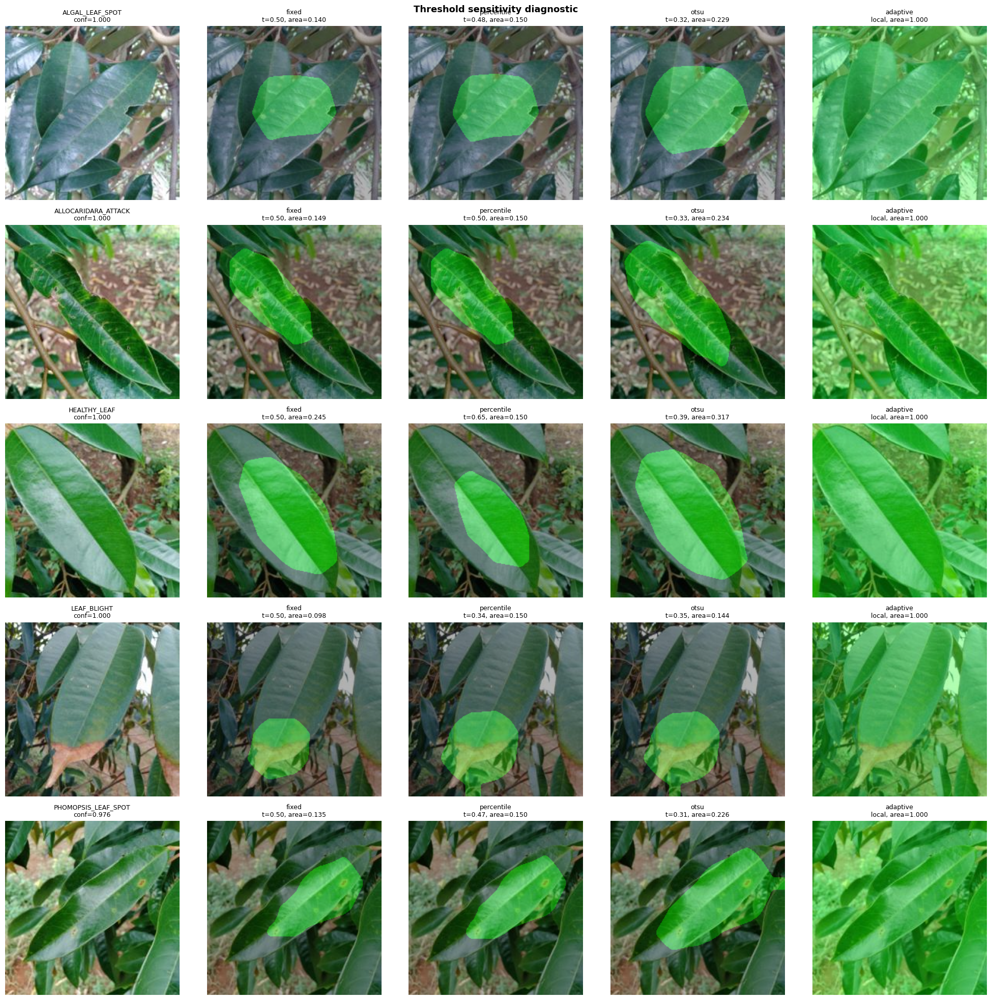

Saved → visualizations/pseudo_labeling/threshold_diagnostic_grid.png


In [16]:
threshold_methods = [
    ("fixed", {"value": 0.5}),
    ("percentile", {"percentile": 85}),
    ("otsu", {}),
    ("adaptive", {"block_size": 35, "c": 2}),
]

fig, axes = plt.subplots(len(CLASS_NAMES), 1 + len(threshold_methods), figsize=(4 * (1 + len(threshold_methods)), 4 * len(CLASS_NAMES)))
fig.suptitle("Threshold sensitivity diagnostic", fontsize=13, fontweight="bold")

for row, cls_name in enumerate(CLASS_NAMES):
    items = results_by_class.get(cls_name, [])
    if not items:
        continue
    coverages = np.array([item["mask"].mean() for item in items])
    median_idx = int(np.argsort(np.abs(coverages - np.median(coverages)))[0])
    item = items[median_idx]
    orig_arr = item["orig_arr"]
    heatmap = item["heatmap"]

    axes[row, 0].imshow(orig_arr)
    axes[row, 0].set_title(f"{cls_name}\nconf={item['confidence']:.3f}", fontsize=9)
    axes[row, 0].axis("off")

    for col, (method, kwargs) in enumerate(threshold_methods, start=1):
        raw_mask, threshold_value = threshold_heatmap(heatmap, method=method, **kwargs)
        mask = postprocess_mask(raw_mask, kernel_size=5, min_area=32, max_components=2)
        _, overlay = make_overlays(orig_arr, heatmap, mask)
        title_threshold = "local" if threshold_value is None else f"t={threshold_value:.2f}"
        axes[row, col].imshow(overlay)
        axes[row, col].set_title(f"{method}\n{title_threshold}, area={mask.mean():.3f}", fontsize=9)
        axes[row, col].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(VIZ_DIR, "threshold_diagnostic_grid.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/threshold_diagnostic_grid.png")


**Nhận xét sau output — Threshold diagnostic**

- **Quan sát chính:** Fixed 0.5 và percentile 85 cho kết quả rất gần nhau trên các sample median: area khoảng 0.098-0.245 với fixed và gần 0.150 với percentile. Otsu giảm ngưỡng xuống khoảng 0.31-0.39 nên mask rộng hơn rõ rệt, area tăng lên 0.144-0.317. Adaptive threshold thất bại trong bối cảnh này vì gần như phủ toàn ảnh ở mọi lớp, area = 1.000.
- **Đánh giá chất lượng pseudo-label:** Fixed/percentile là hai lựa chọn thực tế nhất cho V1. Percentile giúp chuẩn hóa diện tích giữa các ảnh, nhưng có thể ép mọi ảnh về area tương tự dù lesion thật rất nhỏ/lớn. Otsu tăng recall nhưng dễ giảm precision.
- **Rủi ro:** Adaptive không phù hợp với heatmap Grad-CAM mượt; nó biến activation nền thấp thành foreground cục bộ. Otsu cũng nhạy với phân bố heatmap và có xu hướng over-segment ở Algal/Phomopsis.
- **Hàm ý cho segmentation:** Default nên là fixed hoặc percentile, sau đó chọn theo GT_OK/class. Adaptive chỉ nên giữ làm diagnostic, không dùng để export pseudo-label train.
- **Cải thiện đề xuất:** Tune threshold theo class bằng Dice/IoU trên GT_OK: Allocaridara có thể chịu ngưỡng hiện tại, còn Algal/Phomopsis cần chiến lược khác như threshold cao hơn, color prior, hoặc refinement để không phủ cả vùng lá.


## Proxy evaluation và quality gates

Khi chưa có ground-truth đầy đủ, các proxy dưới đây giúp lọc pseudo-label trước khi đưa vào segmentation: diện tích mask, số connected components, tỉ lệ component lớn nhất, confidence classifier và cờ classifier đúng nhãn folder.


=== Quality gate summary ===
quality_gate         review_or_negative  train_candidate
class_name                                              
ALGAL_LEAF_SPOT                      11              502
ALLOCARIDARA_ATTACK                   7              632
HEALTHY_LEAF                        683                0
LEAF_BLIGHT                          10              645
PHOMOPSIS_LEAF_SPOT                  16              598

=== Proxy metrics per class ===
                    confidence                                               \
                         count   mean    std    min    25%    50%  75%  max   
class_name                                                                    
ALGAL_LEAF_SPOT          513.0  0.993  0.027  0.655  0.996  0.999  1.0  1.0   
ALLOCARIDARA_ATTACK      639.0  0.999  0.012  0.745  1.000  1.000  1.0  1.0   
HEALTHY_LEAF             683.0  0.996  0.024  0.612  0.999  1.000  1.0  1.0   
LEAF_BLIGHT              655.0  0.992  0.046  0.387  0.999  1.000

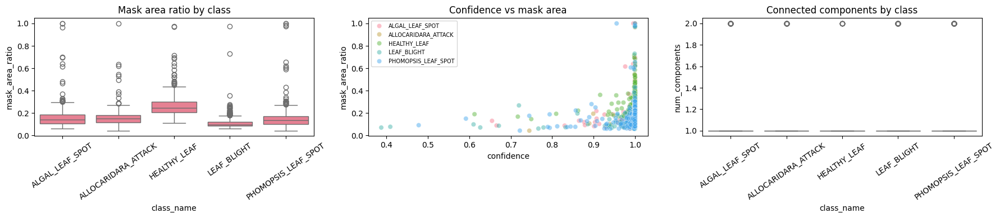

Saved → visualizations/pseudo_labeling/pseudo_label_proxy_quality.png


In [17]:
df = pd.DataFrame(stats).copy()
df["pred_correct"] = df["pred_class"] == df["class_idx"]
if "mask_area_ratio" not in df.columns:
    df["mask_area_ratio"] = df["mask_coverage"]

quality_rules = (
    (df["pred_correct"])
    & (df["confidence"] >= 0.80)
    & (df["mask_area_ratio"].between(0.03, 0.45))
    & (df["class_name"] != "HEALTHY_LEAF")
)
df["quality_gate"] = np.where(quality_rules, "train_candidate", "review_or_negative")

print("=== Quality gate summary ===")
print(df.groupby(["class_name", "quality_gate"]).size().unstack(fill_value=0))
print("\n=== Proxy metrics per class ===")
proxy_cols = [col for col in ["confidence", "mask_area_ratio", "num_components", "largest_component_ratio", "boundary_pixel_ratio"] if col in df.columns]
print(df.groupby("class_name")[proxy_cols].describe().round(3))

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
sns.boxplot(data=df, x="class_name", y="mask_area_ratio", ax=axes[0])
axes[0].set_title("Mask area ratio by class")
axes[0].tick_params(axis="x", rotation=35)

sns.scatterplot(data=df, x="confidence", y="mask_area_ratio", hue="class_name", alpha=0.45, ax=axes[1])
axes[1].set_title("Confidence vs mask area")
axes[1].legend(fontsize=7, loc="best")

if "num_components" in df.columns:
    sns.boxplot(data=df, x="class_name", y="num_components", ax=axes[2])
    axes[2].set_title("Connected components by class")
    axes[2].tick_params(axis="x", rotation=35)
else:
    axes[2].text(0.5, 0.5, "num_components available after rerun generation cell", ha="center", va="center")
    axes[2].axis("off")

plt.tight_layout()
plt.savefig(os.path.join(VIZ_DIR, "pseudo_label_proxy_quality.png"), dpi=150, bbox_inches="tight")
plt.show()
print(f"Saved → {VIZ_DIR}/pseudo_label_proxy_quality.png")


**Nhận xét sau output — Proxy evaluation**

- **Quan sát chính:** Boxplot area cho thấy Healthy có median/mean cao nhất và nhiều outlier; các lớp bệnh chủ yếu nằm quanh 0.10-0.20 nhưng vẫn có outlier gần 1.0. Scatter confidence-area cho thấy nhiều mask lỗi diện tích lớn vẫn có confidence rất cao, nên confidence không đủ để lọc mask. Connected components gần như luôn là 1, thỉnh thoảng 2.
- **Đánh giá chất lượng pseudo-label:** Connected-component filtering làm mask sạch và liền vùng, nhưng cũng phản ánh Grad-CAM đang tạo một vùng lớn thay vì nhiều lesion instance nhỏ. Quality gate hiện chọn 2,377 disease masks làm train_candidate và đưa 44 disease masks vào manual_review; 683 Healthy được đánh dấu negative_empty_mask_or_exclude.
- **Rủi ro:** Proxy area/components phát hiện được lỗi toàn ảnh nhưng không đảm bảo mask nằm đúng lesion. Các ca confidence cao + area hợp lý vẫn có thể chỉ phủ gân lá hoặc vùng lá discriminative.
- **Hàm ý cho segmentation:** Nên train baseline bằng subset train_candidate, không dùng folder pseudo-label nguyên bản. Với Healthy, tạo empty mask nếu muốn negative samples; nếu không, exclude để tránh làm nhiễu positive lesion learning.
- **Cải thiện đề xuất:** Lưu thêm danh sách outlier cần QA gồm area > 0.45, confidence < 0.8 hoặc pred sai; sau đó kiểm tra thủ công tối thiểu 20-30 ảnh/lớp và ưu tiên các outlier.


## Đánh giá với ground-truth mask GT_OK nếu có

Repo có thư mục notebooks/data/raw/GT_OK/SegmentationClass cho một phần dữ liệu. Cell này khớp pseudo-label theo filename, resize GT về kích thước pseudo-mask và tính IoU, Dice, pixel precision/recall, cùng boundary IoU xấp xỉ bằng dải biên morphology.


Matched GT masks: 40
                       iou   dice  pixel_precision  pixel_recall  \
class_name                                                         
ALGAL_LEAF_SPOT      0.116  0.206            0.131         0.669   
ALLOCARIDARA_ATTACK  0.415  0.568            0.557         0.666   
LEAF_BLIGHT          0.275  0.427            0.325         0.690   
PHOMOPSIS_LEAF_SPOT  0.087  0.146            0.090         0.605   

                     boundary_iou  mask_area_ratio  gt_area_ratio  
class_name                                                         
ALGAL_LEAF_SPOT             0.037            0.166          0.036  
ALLOCARIDARA_ATTACK         0.072            0.155          0.135  
LEAF_BLIGHT                 0.038            0.122          0.063  
PHOMOPSIS_LEAF_SPOT         0.032            0.144          0.020  


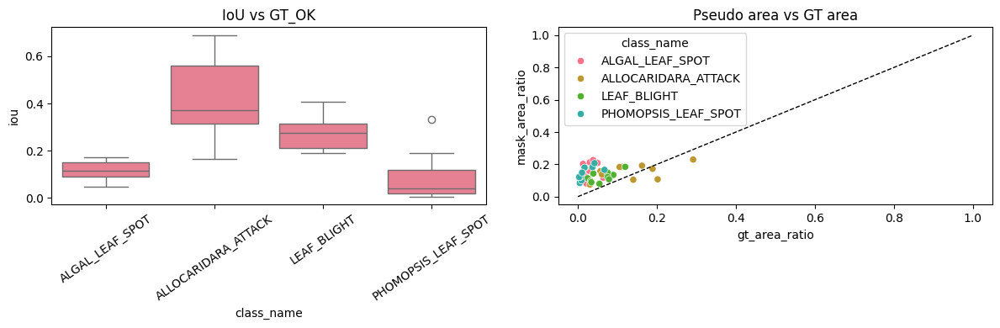

In [18]:
def segmentation_metrics_binary(pred_mask, gt_mask):
    pred = pred_mask.astype(bool)
    gt = gt_mask.astype(bool)
    tp = np.logical_and(pred, gt).sum()
    fp = np.logical_and(pred, ~gt).sum()
    fn = np.logical_and(~pred, gt).sum()
    union = np.logical_or(pred, gt).sum()
    iou = tp / union if union else 0.0
    dice = (2 * tp) / (pred.sum() + gt.sum()) if (pred.sum() + gt.sum()) else 0.0
    precision = tp / (tp + fp) if (tp + fp) else 0.0
    recall = tp / (tp + fn) if (tp + fn) else 0.0
    return iou, dice, precision, recall


def boundary_mask(mask, dilation=2):
    mask = mask.astype(np.uint8)
    kernel = np.ones((2 * dilation + 1, 2 * dilation + 1), np.uint8)
    return cv2.morphologyEx(mask, cv2.MORPH_GRADIENT, kernel).astype(bool)


gt_root = Path(proj_root) / "notebooks" / "data" / "raw" / "GT_OK" / "SegmentationClass"
gt_records = []

if gt_root.exists():
    for row in stats:
        cls_name = row["class_name"]
        if cls_name == "HEALTHY_LEAF":
            continue
        image_stem = row.get("image_id") or Path(row["original_path"]).stem
        gt_path = gt_root / cls_name / f"{image_stem}.png"
        pred_path = Path(row["pseudo_mask_path"]) if "pseudo_mask_path" in row else pseudo_dir / f"{row['filename']}_pseudo.png"
        if not gt_path.exists() or not pred_path.exists():
            continue

        pred = cv2.imread(str(pred_path), cv2.IMREAD_GRAYSCALE)
        gt = cv2.imread(str(gt_path), cv2.IMREAD_GRAYSCALE)
        if pred is None or gt is None:
            continue
        pred = (pred > 127).astype(np.uint8)
        gt = cv2.resize(gt, (pred.shape[1], pred.shape[0]), interpolation=cv2.INTER_NEAREST)
        gt = (gt > 0).astype(np.uint8)

        iou, dice, precision, recall = segmentation_metrics_binary(pred, gt)
        b_pred = boundary_mask(pred, dilation=2)
        b_gt = boundary_mask(gt, dilation=2)
        boundary_union = np.logical_or(b_pred, b_gt).sum()
        boundary_iou = np.logical_and(b_pred, b_gt).sum() / boundary_union if boundary_union else 0.0

        gt_records.append({
            "filename": row["filename"],
            "class_name": cls_name,
            "confidence": row["confidence"],
            "mask_area_ratio": row.get("mask_area_ratio", row.get("mask_coverage")),
            "gt_area_ratio": float(gt.mean()),
            "iou": float(iou),
            "dice": float(dice),
            "pixel_precision": float(precision),
            "pixel_recall": float(recall),
            "boundary_iou": float(boundary_iou),
        })

if gt_records:
    gt_df = pd.DataFrame(gt_records)
    gt_df.to_csv(pseudo_dir / "pseudo_label_gt_ok_metrics.csv", index=False)
    print(f"Matched GT masks: {len(gt_df)}")
    print(gt_df.groupby("class_name")[["iou", "dice", "pixel_precision", "pixel_recall", "boundary_iou", "mask_area_ratio", "gt_area_ratio"]].mean().round(3))

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    sns.boxplot(data=gt_df, x="class_name", y="iou", ax=axes[0])
    axes[0].set_title("IoU vs GT_OK")
    axes[0].tick_params(axis="x", rotation=35)
    sns.scatterplot(data=gt_df, x="gt_area_ratio", y="mask_area_ratio", hue="class_name", ax=axes[1])
    axes[1].plot([0, 1], [0, 1], "k--", linewidth=1)
    axes[1].set_title("Pseudo area vs GT area")
    plt.tight_layout()
    plt.savefig(os.path.join(VIZ_DIR, "gt_ok_pseudo_label_metrics.png"), dpi=150, bbox_inches="tight")
    plt.show()
else:
    print("Không tìm thấy cặp pseudo-label/GT_OK khớp filename. Kiểm tra lại đường dẫn hoặc chạy cell generation trước.")


**Nhận xét sau output — GT_OK metrics**

- **Quan sát chính:** Có 40 mask khớp GT_OK, 10 ảnh cho mỗi lớp bệnh. Allocaridara tốt nhất với IoU 0.41, Dice 0.57, precision 0.56, recall 0.67. Leaf Blight ở mức trung bình với IoU 0.28, Dice 0.43. Algal và Phomopsis yếu: IoU lần lượt 0.12 và 0.09, Dice 0.21 và 0.15.
- **Đánh giá chất lượng pseudo-label:** Recall các lớp đều khoảng 0.60-0.69, cao hơn precision ở Algal/Leaf Blight/Phomopsis. Điều này cho thấy pseudo-mask thường chạm được vùng bệnh nhưng phủ rộng hơn lesion thật, đặc biệt Algal pseudo area 0.17 so với GT area 0.04 và Phomopsis 0.14 so với GT 0.02.
- **Rủi ro:** Boundary IoU rất thấp, chỉ khoảng 0.03-0.07, nghĩa là biên mask không đáng tin cho bài toán cần contour chính xác. Phomopsis có độ biến thiên lớn: IoU min 0.01, max 0.33, nên rất nhạy theo ảnh.
- **Hàm ý cho segmentation:** V1 có thể làm weak supervision để model học vùng bệnh thô, nhưng chưa đủ chất lượng để thay annotation segmentation thật. Nếu dùng hard mask, model dễ học vùng lá xung quanh lesion và giảm precision pixel.
- **Cải thiện đề xuất:** Dùng GT_OK để chọn threshold/hậu xử lý theo class, ưu tiên cải thiện precision cho Algal/Phomopsis. Với Allocaridara, pipeline hiện là ứng viên tốt nhất để train thử nghiệm có kiểm soát.


## Export tập pseudo-label sẵn sàng cho segmentation

Cell này tạo metadata thực dụng cho training: giữ ảnh bệnh high-trust làm candidate, và ghi rõ xử lý Healthy Leaf. Không xóa folder V1 cũ.


In [19]:
seg_ready_dir = Path(proj_root) / "notebooks" / "data" / "pseudo_labels_train_v1_review"
seg_ready_dir.mkdir(parents=True, exist_ok=True)

seg_df = pd.DataFrame(stats).copy()
seg_df["pred_correct"] = seg_df["pred_class"] == seg_df["class_idx"]
if "mask_area_ratio" not in seg_df.columns:
    seg_df["mask_area_ratio"] = seg_df["mask_coverage"]

seg_df["recommended_use"] = np.select(
    [
        seg_df["class_name"].eq("HEALTHY_LEAF"),
        seg_df["pred_correct"] & seg_df["confidence"].ge(0.80) & seg_df["mask_area_ratio"].between(0.03, 0.45),
    ],
    ["negative_empty_mask_or_exclude", "train_candidate"],
    default="manual_review",
)

metadata_path = seg_ready_dir / "metadata_v1_review.csv"
seg_df.to_csv(metadata_path, index=False)

summary = seg_df.groupby(["class_name", "recommended_use"]).size().unstack(fill_value=0)
print(summary)
print(f"Saved metadata → {metadata_path}")


recommended_use      manual_review  negative_empty_mask_or_exclude  \
class_name                                                           
ALGAL_LEAF_SPOT                 11                               0   
ALLOCARIDARA_ATTACK              7                               0   
HEALTHY_LEAF                     0                             683   
LEAF_BLIGHT                     10                               0   
PHOMOPSIS_LEAF_SPOT             16                               0   

recommended_use      train_candidate  
class_name                            
ALGAL_LEAF_SPOT                  502  
ALLOCARIDARA_ATTACK              632  
HEALTHY_LEAF                       0  
LEAF_BLIGHT                      645  
PHOMOPSIS_LEAF_SPOT              598  
Saved metadata → E:\Master\thesis-clean\notebooks\data\pseudo_labels_train_v1_review\metadata_v1_review.csv


**Nhận xét sau output — Segmentation-ready export**

- **Quan sát chính:** Export metadata chia rõ 502 Algal, 632 Allocaridara, 645 Leaf Blight và 598 Phomopsis là `train_candidate`; 44 disease samples là `manual_review`; 683 Healthy là `negative_empty_mask_or_exclude`.
- **Đánh giá chất lượng pseudo-label:** Đây là bước biến notebook từ minh họa sang pipeline có thể dùng thực tế hơn, vì segmentation training có thể lọc dữ liệu theo recommended_use.
- **Rủi ro:** Export hiện mới là metadata, chưa tạo mask rỗng cho Healthy hoặc copy subset sạch sang thư mục riêng. Nếu dataloader bỏ qua metadata, rủi ro dùng nhầm mask thô vẫn còn.
- **Hàm ý cho segmentation:** Notebook segmentation tiếp theo nên đọc metadata này, dùng disease train_candidate trước, và quyết định rõ Healthy = empty mask hay exclude.
- **Cải thiện đề xuất:** Tạo script/cell materialize dataset segmentation-ready gồm `images/`, `masks/`, `metadata.csv` và danh sách manual_review.


## Kết luận review notebook 04

1. **Notebook hiện đang mạnh/yếu ở đâu:** Mạnh ở pipeline end-to-end đã chạy được trên 3,104 ảnh train, dùng đúng EfficientNet-B0 checkpoint và Grad-CAM target layer base.features.8.0. Notebook cũng đã có visualization, threshold diagnostic, proxy QA và GT_OK evaluation. Yếu ở chất lượng localization: nhiều mask là vùng activation lớn trên lá chứ chưa phải biên lesion chính xác.
2. **Pipeline Grad-CAM -> pseudo-label đã hợp lý chưa:** Hợp lý như baseline weak pseudo-label, đặc biệt cho Allocaridara. Chưa hợp lý để dùng như ground truth cứng trên toàn bộ tập vì Algal/Phomopsis có IoU thấp và một số outlier mask phủ gần toàn ảnh.
3. **Những phần đã bổ sung hoặc tối ưu:** Seed reproducibility, hàm normalize/resize/threshold/postprocess, metadata đầy đủ, so sánh fixed/percentile/Otsu/adaptive, proxy quality gates, GT_OK metrics và export metadata segmentation-ready.
4. **Insight chính từ visual output:** Fixed và percentile ổn định nhất; Otsu mở rộng mask; adaptive không dùng được vì phủ toàn ảnh. Grad-CAM thường bắt vùng bệnh chính nhưng bỏ sót lesion nhỏ rải rác. Healthy Leaf sinh activation lớn trên phiến lá, phải xem là negative/exclude.
5. **Rủi ro lớn nhất:** Segmentation model học bias discriminative attention của classifier thay vì toàn bộ vùng bệnh. Rủi ro cụ thể là over-segment lá quanh lesion, boundary kém, và nhiễu từ Healthy nếu không chuyển thành empty mask/exclude.
6. **Bước tiếp theo trước training segmentation:** Dùng metadata_v1_review.csv để train trước trên 2,377 disease train_candidate, loại/review 44 disease outlier, dùng 683 Healthy làm empty-mask negative hoặc exclude. Tune threshold theo GT_OK, kiểm tra QA thủ công subset mỗi lớp, rồi train segmentation với loss chịu nhiễu pseudo-label và đánh giá lại bằng manual GT.
